# DCGANチュートリアル

In [27]:
import sys
import os
from pathlib import Path

# importディレクトリの追加
# sys.path.append(os.path.join(os.path.dirname(__file__), '..'))
print(sys.path)

# プロキシの設定
# os.environ['HTTP_PROXY'] = ''
# os.environ['HTTPS_PROXY'] = ''

%matplotlib inline

['/home/y-katayama/notebooks/dl_study/02_pytorch_tutorial', '/usr/lib/python38.zip', '/usr/lib/python3.8', '/usr/lib/python3.8/lib-dynload', '', '/home/y-katayama/venv/pt1.7/lib/python3.8/site-packages']


In [28]:
!nvidia-smi

Mon Jan 23 16:37:16 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.60.13    Driver Version: 525.60.13    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:01:00.0 Off |                  N/A |
| 40%   31C    P8    17W / 184W |   1116MiB /  8192MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA GeForce ...  On   | 00000000:03:00.0 Off |                  N/A |
| 40%   

# はじめに

- 本チュートリアルではDCGAN(Deep Convlutional GAN)について解説する
- 実在する有名人の多数の写真をネットワークに訓練させ、その後、実在しない有名人風の画像を生成する敵対的生成ネットワーク(Generative Adversarial Network = GAN)を構築する

- 本チュートリアルに掲載しているコードのうちほとんどは、[pytorch/example](https://github.com/pytorch/examples)で公開されているDCGANのコード

# GAN: 生成的敵対的ネットワーク

- GANは学習データの分布をとらえるようにDLモデルを訓練するためのフレームワーク
  - モデルがデータの分布を把握していればその分布を元に新しいデータを生成できる


- GANは2014年にIan Goodfellowによって発明され、[Generative Adversarial Nets](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf)という論文で提示された

- GANは生成器と識別器と呼ばれる, 2つの異なるモデルから構成される

  - 生成器: 訓練画像に似た"偽の画像"を生成する  
  - 識別機: 入力画像の真贋を判定する  

- 訓練中, 生成器はより優れた偽物を次々と生成して識別器を騙そうとし, 識別器はより優れた真贋の鑑定士となって、本物と偽物の画像を正しく分類しようとする

- 生成器が訓練データから取得したように見える「完璧な偽物」を生成した時、この「偽画像生成 vs 正しい画像識別」のゲームは均衡状態になります。
  このとき、識別器は生成器が生成した画像が本物か偽物かを、**常に50%の信頼度で推測することになる**

## 式での説明

### 識別機

- $ x $: 画像データ
- $ D(x) $: 識別用ネットワーク. $ x $が訓練データである確率(生成器による出力ではない確率)をスカラー値で出力する
  - 今回は画像を扱っているので、$D(x)$に対する入力は、サイズが3x64x64（C×H×W）の画像となる
  
- $D(x)$が出力する確率は、$x$が訓練データから取得された場合は高い値が良く、$x$が生成器から出力される場合は低い値が良い
  - このことから, $D(x)$は、一般的な二値分類器と考えることもできる
  
### 生成器

- $z$: 標準正規分布からサンプリングされた潜在空間ベクトル
- $G(z)$: $z$を画像データ空間に写像する生成関数 （※ベクトル$z$を画像データに変換するようなイメージ）

- $G$の目標は、訓練データのサンプリング元となっている真の確率分布($p_{data}$)を推定すること。
- 訓練データの確率分布を推定することができれば、その推定された分布($p_{g}$)から偽のサンプル画像を生成することができる


- $D(G(z)) = $ 生成器$G$の出力画像を識別器$D$に入力したときの真贋の予測確率
- [Goodfellow氏による論文](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf)に書かれているように、$D$と$G$は、次のようなMinimaxゲームをしている
  - Minimaxゲームは、相手がベストな選択をすると想定したうえで、こちらの損失を最小にすることを目指すゲーム

- すなわち、$D$は、本物と偽物を正しく分類する確率($logD(x)$)を最大化しようとする
- そして $G$は、$D$が偽物だと当てる確率（$log(1 - D(G(z)))$）を最小化しようとする。

- GANの損失関数は次の式で表される。

$\begin{align}\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]\end{align}$

- 理論的には、このMinimaxゲームの解は$p_{g} = p_{data}$となる地点。
  - ここで, $p_g$はGが生成する偽画像の確率分布で, $p_{data}$は訓練画像の確率分布
  
- この二つの分布が等しくなる時、$D$には偽物と本物の違いが分からなくなるため、ランダムに推測するのと同じ状態になる

- ただし, GANの収束理論は今なお研究が活発な途上のテーマであり、必ずしも$p_{g} = p_{data}$となる地点まで訓練されるのがベストではないことに注意。

# DCGAN

- DCGANは、ここまで解説したGANの内容そのまま拡張し, **識別器$D$に畳み込み層**、**生成器$G$に逆畳み込み層**を使用した手法
- Radfordらによる論文[Unsupervised Representation Learning With Deep Convolutional Generative Adversarial Networks](https://arxiv.org/pdf/1511.06434.pdf)で提案された

## 識別機
- 識別器$D$は、[ストライド付き畳み込み層](https://pytorch.org/docs/stable/nn.html#torch.nn.Conv2d), [バッチ正規化層](https://pytorch.org/docs/stable/nn.html#torch.nn.BatchNorm2d), [活性化関数 LeakyReLU](https://pytorch.org/docs/stable/nn.html#torch.nn.LeakyReLU)で構成される
<br>
- $D$の入力は, 3x64x64（C×H×W）のRGB画像
- $D$の出力は, 入力画像が真の分布からサンプリングされた確率(スカラー値)となる

## 生成器

- 生成器$G$は, [逆畳み込み](https://pytorch.org/docs/stable/nn.html#torch.nn.ConvTranspose2d) 層、バッチ正規化層、活性化関数[ReLU](https://pytorch.org/docs/stable/nn.html#relu)で構成される
- $G$の入力は潜在ベクトル$z$で、これは標準正規分布からサンプリングされたもの。
- $G$の出力は3x64x64（C×H×W）のRGB画像となる。

- ストライド付き逆畳み込み層により、潜在ベクトルを画像と同じ形式のデータに変換することができます。（単なるベクトルである$z$の形をどんどん変化させ、3x64x64にまで変形する。）

# 実装

In [29]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# 再現性のためにrandom seedを設定する
manualSeed = 999
#manualSeed = random.randint(1, 10000) # 新たな結果を得たい場合に使用する
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


## 入力パラメータ

-   **dataroot**: データセットフォルダのルート・ディレクトリへのパス。
-   **workers**: `DataLoader`でデータを読み込むためのワーカースレッドの数。
-   **batch\_size**: 訓練に使用するバッチサイズです。論文では128を利用
-   **image\_size**: 
    学習に使用される画像の高さと幅のサイズ<br>
    デフォルトは 64x64となっています。別のサイズの画像が必要な場合は、DとGの構造を変更する必要がある。
    詳細は[こちら](https://github.com/pytorch/examples/issues/70)
-   **nc**: 入力画像のカラーのチャネル数です。カラー画像の場合は3
-   **nz**: 潜在ベクトルの長さ。
-   **ngf**: 生成器を伝播する特徴マップの深さ。
-   **ndf**: 識別器を伝搬する特徴量マップの深さ。
-   **num\_epochs**: 訓練時に実行するエポック数です。
-   **lr** -: 訓練のための学習率です。(推奨値: 0.0002)
-   **beta1**:  オプティマイザ：Adamのためのβ1ハイパーパラメータ(推奨値: 0.5)
-   **ngpu**: 利用可能な GPUコア数。

In [30]:
# データセットのルートディレクトリ
dataroot = '/home/y-katayama/notebooks/dl_study/02_pytorch_tutorial/data/img_align_celeba/train/'

# dataloaderのワーカー数
workers = 2

# 訓練中のバッチサイズ
batch_size = 128

# 訓練画像の高さと幅のサイズ
# 全ての画像は変換器を使ってこのサイズにリサイズされます。
image_size = 64

# 訓練画像のチャンネル数。カラー画像の場合は3。
nc = 3

# 潜在ベクトルzのサイズ (すなわち,、生成器に入力されるベクトルのサイズ)
nz = 100

# 生成器を伝播する特徴マップのサイズ
ngf = 64

# 識別器を伝播する特徴量マップのサイズ
ndf = 64

# 訓練エポック数
num_epochs = 5

# オプティマイザの学習率
lr = 0.0002

# オプティマイザ：Adamのハイパーパラメータ Beta1の値
beta1 = 0.5

#  利用可能なGPUの数。CPUモードの場合は0を使用。
ngpu = 2

## データセット
- このチュートリアルでは[Celeb-A Facesデータセット](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) を使用する。
  - 予めダウンロードして, ディレクトリへの設置が必要

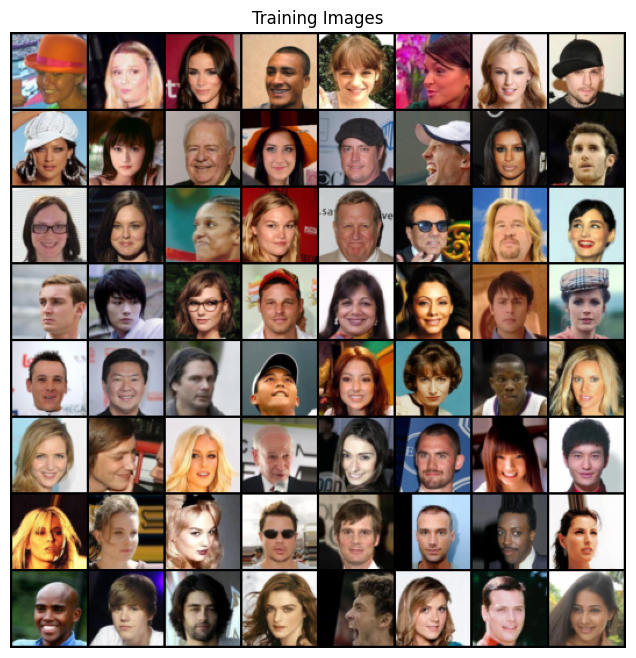

In [31]:
# 画像フォルダのデータセットを設定した方法で使用できます。
# datasetオブジェクトの作成
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# dataloaderオブジェクトの作成
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers, drop_last=True)  # 日本語版drop_last=Trueを追記しています

# どのデバイスで実行するかを決める
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# トレーニング画像をプロット
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## 重みの初期化

- DCGANの論文では, モデルの重みは平均0, 標準偏差0.02の正規分布からランダムサンプリングして初期化することを指定している
- 以下の`weights_init関数`では, 重みが初期化されたモデルを入力とし,**mean=0, std=0.02となるように, すべての畳み込み層, 逆畳み込み層, バッチ正規化層を初期化する**

In [32]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


## 生成器

- **生成器G**は **潜在空間ベクトル** $(z)$を訓練データ空間に写像する

- $z$をデータ空間に写像することは, <u>訓練画像と同じサイズ(3x64x64)のRGB画像を作成することを意味する。</u>
    - このデータ変換は 二次元の逆畳み込み層を繰り返すことで実現される


- それぞれの逆畳み込み層は, <u>二次元バッチ正規化層と活性化関数ReLUのセット</u>になっている
- 最終層では, 値の範囲を入力データと同じ[-1. 1](これなに?)に戻すために, 生成器の出力をtanh()に通す
- バッチ正規化層によって, 学習中の勾配の流れがスムーズになるらしい

In [33]:
class Generator(nn.Module):
    
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu        
        self.main = nn.Sequential(
            
            # nz: 入力ベクトルの長さ
            # ngf: 生成器に伝播する特徴マップのサイズ
            # nc: 出力画像のチャンネル数(RGBなら3)
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            
            # サイズ(ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            # サイズ：(ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            
            # サイズ: (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            # サイズ：(ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, input):
            return self.main(input)
            
    

- 生成器オブジェクトの構造を確認してみる
  - 最終層が訓練画像と同じサイズのテンソルを出力していることがわかる(3x64x64)

In [34]:
# 生成器オブジェクトを作成する
netG = Generator(ngpu).to(device)

# 必要に応じてマルチCPUを扱う
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# weights_init関数を適用して、mean=0, stdev=0.2になるようすべての重みをランダムに初期化する
netG.apply(weights_init)

# モデルをprint出力する
print(netG)

DataParallel(
  (module): Generator(
    (main): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2

## 識別機

- 識別器Dは画像を入力し, その画像が本物である確率をスカラー値で出力する. (二値分類ネットワーク)

- 識別器は(3x64x64)の入力画像を受け取り, いくつかの畳み込みブロックに伝播させていく

    - それぞれの畳み込みブロックは <u>**Conv2d, BatchNorm2D, LeakyReLU**の3層で構成される.
    - 最後にSigmoid関数を適用して, 最終的な確率を出力する
    
- ストライド付き畳み込みでダウンサンプルをするのは, ネットワークが独自のプーリング関数を学習できるようにするため  
    - 単にプーリングするより, ストライド畳み込みの方が優れた方法らしい
    
- バッチ正規化とLeaky ReLUは 生成器Gと識別器Dの双方にとって重要な勾配の伝播を安定化させる働きがある

In [35]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # 入力は (NC) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            # サイズ：(ndf) x 32 x 32
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),
            
            # サイズ： (ndf*2) x 16 x 16
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),
            
            # サイズ：(ndf*4) x 8 x 8
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # サイズ： (ndf*8) x 4 x 4
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

識別器のオブジェクトを参照して構造を確認する

In [36]:
# 識別器を作成する
netD = Discriminator(ngpu).to(device)

# 必要に応じてマルチCPUを扱う
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# weights_init関数を適用して、mean=0, stdev=0.2になるようすべての重みをランダムに初期化する
netD.apply(weights_init)

# モデルをprint出力する
print(netD)

DataParallel(
  (module): Discriminator(
    (main): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    

## 損失関数とオプティマイザ―

損失関数として、ここではPyTorchで定義されている以下のBinary Cross Entropy loss（[BCELoss](https://pytorch.org/docs/stable/nn.html#torch.nn.BCELoss)）を使用する。


$\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]$

GANの損失関数の両方の対数成分（$log(D(x))$と$log(1 - D(G(z)))$)の算出に、このBCE関数がどのように利用されることになるか考えてみましょう。

（日本語訳注：GANの損失関数は  $\begin{align}\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]\end{align}$  です。）

<br>

BCE関数の一部（具体的には$y$）は、値を指定することが可能です。

本チュートリアルでこの後に出てくる訓練ループでは、実際にBCE関数の$y$を指定する形で実装をしています。

ですがここでは、$y$(つまり正解ラベル)を変更することで、どのように算出する損失関数の成分を選択できるのかを理解することが重要です。

損失関数を設定した後、本物のラベルを1、偽物のラベルを0として定義します。
このラベルは、識別器 D と生成器 G の損失を計算する際に用いられます。
 - なお、このラベルのつけ方はオリジナルのGAN論文でも使用されています。

- 最後に、識別器 D と生成器 G それぞれに、独立したオプティマイザーを設定します。
- DCGAN論文で指定されているように、どちらも学習率0.0002、Beta1 =0.5のAdamを利用します。

- 生成器の訓練の進行状況を確認するために、ガウス分布から抽出された潜在ベクトルの固定ノイズバッチ（すなわちfixed_noze）を作成します。
- 訓練ループではこのfixed_noiseを定期的に生成器 G に入力し、イテレーションを重ねるなかでノイズから画像が形成されていく様子を確認することができます。

In [37]:
# BCELossの初期化
criterion = nn.BCELoss()

# 生成器の訓練の進行状況を可視化する(使用される洗剤ベクトルのバッチを作る)
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# 訓練中に使用する本物と偽物のラベルを設定
real_label = 1.
fake_label = 0.

# GとDの両方にオプティマイザAdam:を設定する
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

ここで記録する訓練時の統計量は以下の通りです。

- **Loss\_D**

  識別器Dの損失です。全ての本物画像のバッチと、全ての偽画像のバッチの損失の合計として計算されます。<br>
    具体的には、次の式で算出されます。

  $log(D(x)) + log(D(G(z)))$

-   **Loss\_G** - <br>
    生成器の損失で、次のように計算されます。<br>
  $log(D(G(z)))$
-   **D(x**) -<br>
    全ての本物画像のバッチに対する識別器による出力値の（バッチ全体の）平均です。<br>
    最初は1に近い値で始まり、理論的には生成器$G$の性能が向上すると0.5に収束します。<br>
    なぜこのような形で収束するのかは、考えてみてください。
-   **D(G(z**)) - <br>
    全ての偽画像のバッチに対する識別器による出力値の平均です。<br>
    最初に出力される値は、識別器$D$が更新される前に出力されることになります。<br>
    そして、２番目の値は、識別器Dのパラメータが更新された後に出力されます。<br>
    この数値は0付近から始まり、生成器$G$の性能が向上するにつれて0.5に収束します。<br>
    なぜこのような形で収束するのかは、考えてみてください。

<br>

**注意:**<br>
実行するエポック数や、データセットからデータを削除するか否かによって、このステップの実行には時間がかかるかもしれません。

In [39]:
# 訓練のループ

# 訓練の進捗状況を把握するためのリスト
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")

for epoch in range(num_epochs):
    
    # dataloader内の各バッチ回数でループ
    for i, data in enumerate(dataloader, 0):
        
        ############################
        #  (1) 識別器Dのネットワーク更新: maximize log(D(x)+ log(1 - D(G(z)) )
        ###########################
        
        ## 本物画像のバッチを使った訓練
        netD.zero_grad()
        
        # バッチの形式をランタイムに合わせる
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        # b_size分のテンソルをreal_labelの値で埋める
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # 本物画像のバッチをDに順伝播させる
        output = netD(real_cpu).view(-1)
        
        # すべての本物画像のバッチ損失を計算させる
        errD_real = criterion(output, label)
        
        # 逆伝播で勾配を計算する
        errD_real.backward()
        D_x = output.mean().item()
        
        ## 偽物画像のバッチを使った訓練
        # 潜在ベクトルのバッチを生成
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        
        # Gを使って偽画像のバッチを生成
        fake = netG(noise)
        label.fill_(fake_label)
        
        # Dを使ってすべての偽画像について分類
        output = netD(fake.detach()).view(-1)
        
        # すべての偽画像に対するDの損失を計算
        errD_fake = criterion(output, label)
        
        # 偽画像に対する勾配を計算
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        # すべての本物画像のバッチの勾配と, 偽画像のバッチ勾配を足す
        errD = errD_real + errD_fake
        
        # Dのパラメータを更新
        optimizerD.step()
        
        ############################
        # (2) 生成器Gのネットワークを更新: maximize log(D(G(z)))
        ###########################
        
        netG.zero_grad()
        label.fill_(real_label)    # 生成器の損失にとっては, 偽画像のラベルが正解となる
        # ちょうど識別器Dを更新したので, 偽画像バッチをもう一度, 識別機Dに順伝播させる
        output = netD(fake).view(-1)
        
        # この画像に出力するGの損失を再び計算する
        errG = criterion(output, label)
        
        # Gの勾配を計算する
        errG.backward()
        D_G_z2 = output.mean().item()
        
        # Gのパラメータを更新する
        optimizerG.step()
        
        # 訓練ステータスの表示
        if i % 50 ==0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # プロット用に損失を保存
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        
        # 生成器Gの出力をfixed_noiseに保存して、生成器の動作を確認
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/5][0/312]	Loss_D: 0.1006	Loss_G: 6.4867	D(x): 0.9462	D(G(z)): 0.0204 / 0.0032
[0/5][50/312]	Loss_D: 0.2210	Loss_G: 24.0783	D(x): 0.9010	D(G(z)): 0.0000 / 0.0000
[0/5][100/312]	Loss_D: 0.2030	Loss_G: 5.5716	D(x): 0.9351	D(G(z)): 0.0551 / 0.0254
[0/5][150/312]	Loss_D: 0.5709	Loss_G: 4.5451	D(x): 0.9001	D(G(z)): 0.3109 / 0.0221
[0/5][200/312]	Loss_D: 0.4465	Loss_G: 2.7386	D(x): 0.7825	D(G(z)): 0.1114 / 0.0965
[0/5][250/312]	Loss_D: 0.5465	Loss_G: 5.9374	D(x): 0.7439	D(G(z)): 0.0718 / 0.0095
[0/5][300/312]	Loss_D: 0.7205	Loss_G: 4.7465	D(x): 0.8047	D(G(z)): 0.2829 / 0.0174
[1/5][0/312]	Loss_D: 0.4578	Loss_G: 4.8113	D(x): 0.8775	D(G(z)): 0.2378 / 0.0154
[1/5][50/312]	Loss_D: 0.4424	Loss_G: 3.6929	D(x): 0.7693	D(G(z)): 0.0922 / 0.0450
[1/5][100/312]	Loss_D: 0.6395	Loss_G: 6.4724	D(x): 0.8830	D(G(z)): 0.3281 / 0.0057
[1/5][150/312]	Loss_D: 0.3846	Loss_G: 5.4241	D(x): 0.8681	D(G(z)): 0.1771 / 0.0084
[1/5][200/312]	Loss_D: 0.5687	Loss_G: 3.4097	D(x): 0.7195	D(G(z)):

結果 
----

最後に、どのような結果になったのかを確認してみましょう。

ここでは、三つの結果を確認します。

一つ目に、訓練中に識別器$D$と生成器$G$の損失がどのように変化したかを確認します。

二つ目に、固定ノイズ（`fixed_noise`）のバッチに対する生成器$G$の出力をエポックごとに可視化します。

そして三つ目に、本物のデータのバッチの隣に、生成器$G$が出力する偽データのバッチを配置して確認してみましょう。

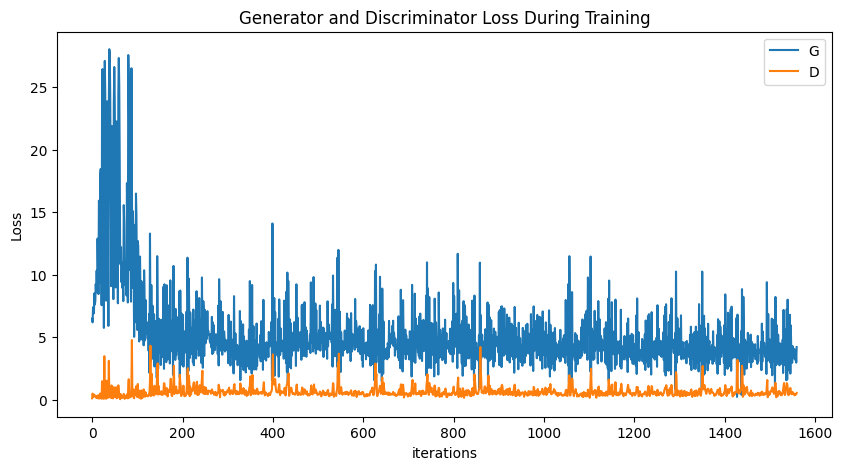

In [40]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

**生成器$G$の訓練進行状況の可視化**

訓練のエポックごとに、固定ノイズ（`fixed_noise`）バッチに対する生成器の出力を保存していました。

ここで、アニメーションを使って生成器$G$の学習の進行状況を可視化してみましょう。

再生ボタンを押すとアニメーションが始まります。

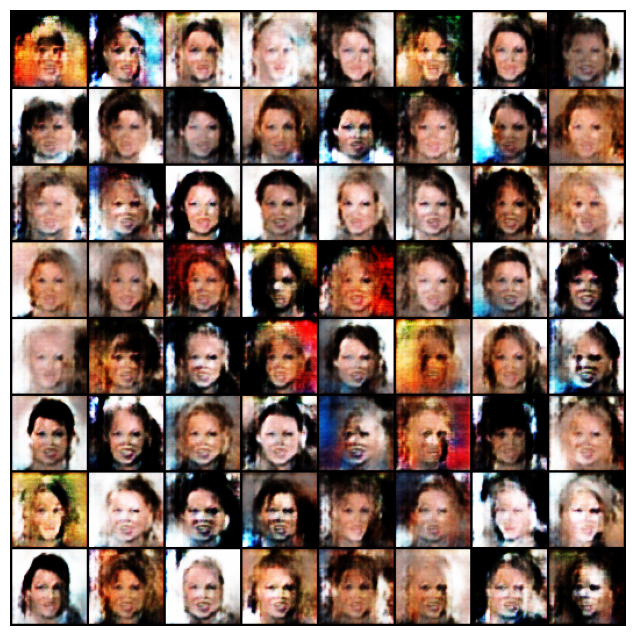

In [41]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

**本物の画像と偽物の画像**

最後に、本物の画像と偽物の画像を並べて確認してみましょう。

（日本語訳注：全てのサンプル画像を使って訓練を行った場合の例を以下に掲載します。）

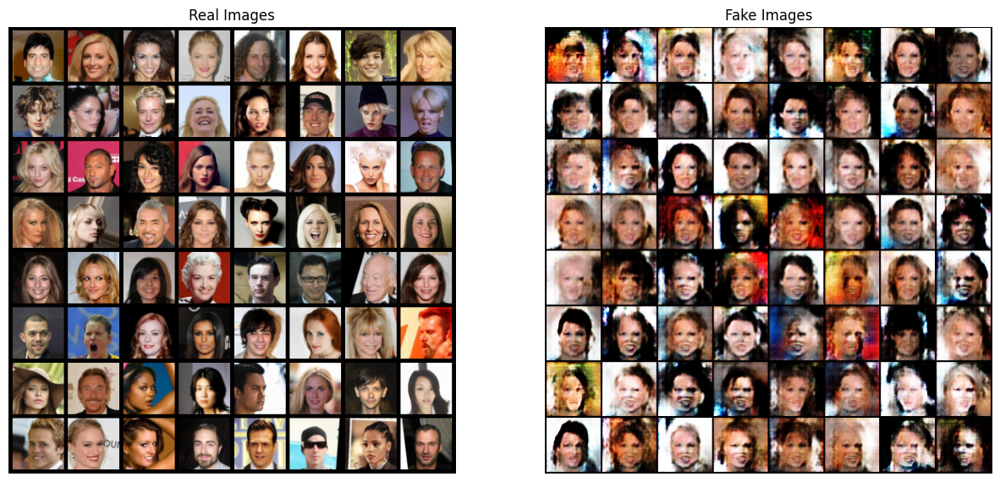

In [42]:
# dataloaderから本物の画像を取得する
real_batch = next(iter(dataloader))

# 本物画像をプロット
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# 最後のエポックから偽物画像をプロットする
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()